In [79]:
import os

import pandas as pd
import numpy as np

import colorcet as cc
import cmocean.cm as cmo

import holoviews as hv
import matplotlib.pyplot as plt
import seaborn as sns

import lateral_signaling as lsig

<hr>

In [143]:
# Parameters for saving figures/data
save_figs = False
fmt   = "png"
dpi       = 300

# Set directories for I/O
data_dir  = os.path.abspath("../data/FACS_data")
plot_dir  = os.path.abspath("../plots")

# Set filenames for I/O
metadata_fname = os.path.join(data_dir, "metadata2.csv")
violin_fname = lambda i: os.path.join(plot_dir, f"FACS_violins_{i + 1}." + fmt)
violin_fname_sns = lambda i: os.path.join(plot_dir, f"FACS_violins_sns_{i + 1}." + fmt)

---

In [149]:
metadata = pd.read_csv(metadata_fname).fillna("")
metadata

,filename,Experiment,Control,Senders,Density,Matrix,Drug treatment,Label,subplot,Color
0,a1.csv,Neg. Ctrl.,Neg,-,1x,-,-,,abcd,#e16566
1,a2.csv,Density,-,+,0.25x,-,-,,ad,#0905b9
2,a3.csv,Density,-,+,0.5x,-,-,,ad,#2023ef
3,a4.csv,Density,Pos,+,1x,-,-,▲,ad,#2f55fb
4,a5.csv,Density,-,+,2x,-,-,,ad,#2b81fd
5,a6.csv,Density,-,+,3x,-,-,,ad,#35a8fc
6,a7.csv,Density,-,+,4x,-,-,,ad,#29cffb
7,f1.csv,ECM,Pos,+,1x,-,-,,bd,#6d80b6
8,e1.csv,ECM,-,+,1x,0.2 kPa PDMS,-,,bd,#7402cd
9,e2.csv,ECM,-,+,1x,8.0 kPa PDMS,-,,bd,#e2d0e5


In [135]:
data = [pd.read_csv(os.path.join(data_dir, f)).squeeze() for f in metadata.filename]

<hr>

In [145]:
solar_sampled  = cmo.solar(np.linspace(0, 1, 10)[2:9])
haline_sampled = cmo.haline(np.linspace(0, 1, 8)[4:7]) 

In [147]:
metadata["Color_"] = metadata.Color.copy()

metadata.Color_[7:14]  = [lsig.rgba2hex(rgba * 255) for rgba in solar_sampled]
metadata.Color_[16:19] = [lsig.rgba2hex(rgba * 255) for rgba in haline_sampled]

In [148]:
# metadata["Color"] = metadata["Color_"]
# del metadata["Color_"]

# metadata.to_csv(metadata_fname, index=False)

In [150]:
# plot_idx_list = [
#     np.array([0,  1,  2,  3,  4,  5,  6,     ]),
#     np.array([0, 10, 11, 12, 13,  7,  8,  9, ]),
#     np.array([0, 22, 14, 16, 17,             ]),
# ]

plot_idx_list = [metadata.subplot.str.contains(char).values.nonzero()[0] for char in "abc"]

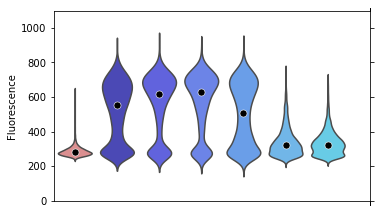

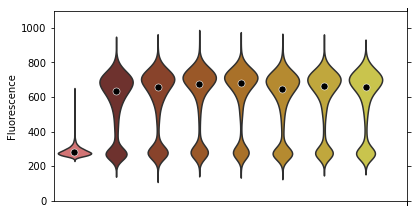

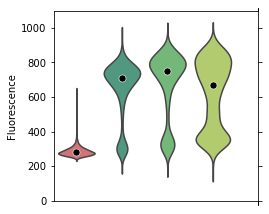

In [152]:
for i, data_idx in enumerate(plot_idx_list):
    
    plt.figure(figsize = (2/3 * data_idx.size + 1, 3.5))
    
    plt.cla()
    
    violin_data = [data[j] for j in data_idx]
    violin_medians = [np.median(d) for d in violin_data]
    data_sizes =  [d.size for d in violin_data]

    violin_df = pd.DataFrame(dict(
        Condition    = np.repeat(metadata.filename[data_idx], data_sizes),
        Fluorescence = np.concatenate(violin_data),
        Color        = np.repeat(metadata.Color[data_idx], data_sizes),
    ))

    violin_median_df = pd.DataFrame(dict(
        Condition    = metadata.filename[data_idx],
        Median       = violin_medians,
        Color        = metadata.Color[data_idx],
    ))

#     colors = metadata.Color[data_idx].to_list()
    
    colors = lsig.hexa2hex(metadata.Color[data_idx].to_list(), 0.8)
    
    if i == 1:
        colors = np.zeros((data_idx.size, 4), dtype=float)
        colors[0] = np.array([*lsig.hex2rgb("#e16566"), 0.]) / 255
        colors[1:] = solar_sampled

    elif i == 2:
        colors = np.zeros((data_idx.size, 4), dtype=float)
        colors[0] = np.array([*lsig.hex2rgb("#e16566"), 0.]) / 255
        colors[1:] = haline_sampled
    
    ax = sns.violinplot(
        x="Condition", 
        y="Fluorescence", 
        data=violin_df, 
        scale="width", 
        palette=colors, 
        inner=None,
    )

    sns.scatterplot(
        ax=ax,
        x="Condition",
        y="Median",
        data=violin_median_df,
        color="k",
        s=50,
    )

    plt.xlim((-0.5, data_idx.size - 0.5))
    plt.ylim((0, 1100))
    
    plt.xlabel("")
    plt.xticks([""] * data_idx.size)

    if save_figs:
        plt.savefig(violin_fname_sns(i), dpi=dpi)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
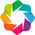

['#e16566', '#0905b9', '#2023ef', '#2f55fb', '#2b81fd', '#35a8fc', '#29cffb']
['#e16566', '#efc069', '#efc069', '#efc069', '#efc069', '#efc069', '#efc069', '#efc069']
['#e16566', '#1dab99', '#1dab99', '#1dab99']


In [67]:
hv.extension("bokeh")

violins = []
for i, data_idx in enumerate(plot_idx_list):
    
    violin_data = [data[j] for j in data_idx]
    violin_medians = [np.median(d) for d in violin_data]
    data_sizes =  [d.size for d in violin_data]
    
    violin_df = pd.DataFrame(dict(
        Condition    = np.repeat(metadata.filename[data_idx], data_sizes),
        Fluorescence = np.concatenate(violin_data),
        Median       = np.repeat(violin_medians, data_sizes),
        Color        = np.repeat(metadata.Color[data_idx], data_sizes),
    ))
    
    colors = metadata.Color[data_idx].to_list()
    print(colors)
    
    # violin1_df = pd.DataFrame(dict(
    #     Condition    = np.repeat(violin1_labels, violin1_sizes),
    #     Fluorescence = np.concatenate(violin1_data),
    # ))

    violin = hv.Violin(
        violin_df, 
        kdims=["Condition"], 
        vdims=["Fluorescence"], 
    ).opts(
        ylim=(0, 1200),
        xlabel="",
        xticks=0,
        xrotation=90,
        ylabel=r"mCherry (AU)",
        yticks=np.linspace(0, 1000, 6),
        fontscale=1.8,
        # facecolors=cc.gray[175],
        # box_color=(0,0,0,0),
        # edgecolors=(0,0,0,0),
        # stats_color="k",
        # showmeans=True,
        # inner=None,
        # inner="medians",
        aspect=0.25 * (2 + len(data_idx)),
        axiswise=True,
#         box_fill_color="k",
        box_alpha=0,
        median_color="k",
        violin_color=hv.Cycle(colors), 
    )
    
    violin_medians = hv.Scatter(
        violin_df, 
        kdims=["Condition"], 
        vdims=["Median"], 
    ).opts(
        marker="d",
#         color="k",
        color="Color",
        size=12,
        axiswise=True,
    )
    
    dir(violin)
    
    violins.append(violin * violin_medians)

violin_layout = hv.Layout(violins).cols(1)

In [91]:
hv.output(violins[0], dpi=100)

:Overlay
   .Violin.I  :Violin   [Condition]   (Fluorescence)
   .Scatter.I :Scatter   [Condition]   (Median)

In [92]:
hv.output(violins[1], dpi=100)

:Overlay
   .Violin.I  :Violin   [Condition]   (Fluorescence)
   .Scatter.I :Scatter   [Condition]   (Median)

In [93]:
hv.output(violins[2], dpi=100)

:Overlay
   .Violin.I  :Violin   [Condition]   (Fluorescence)
   .Scatter.I :Scatter   [Condition]   (Median)

In [10]:
# # Save figure
# if save_figs:
    
#     for i, v in enumerate(violins):
#         fname = f"FACS_violin_{i + 1}"
#         fpath = os.path.join(plot_dir, fname + "." + fig_fmt)
#         hv.save(v, fpath, dpi=dpi)

<hr>

In [5]:
# plot_idx_list = [
#     np.array([0,  1,  2,  3,  4,  5,  6,     ]),
#     np.array([0, 10, 11, 12, 13,  7,  8,  9, ]),
#     np.array([0, 22, 14, 16, 17,             ]),
# ]

plot_idx_list = [metadata.subplot.str.contains(char).values.nonzero()[0] for char in "abc"]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
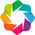

In [6]:
hv.extension("bokeh")

violins = []

for i, data_idx in enumerate(plot_idx_list):
    
    violin_data = [data[j] for j in data_idx]
    violin_medians = [np.median(d) for d in violin_data]
    data_sizes =  [d.size for d in violin_data]


    violin_df = pd.DataFrame(dict(
        Condition    = np.repeat(metadata.filename[data_idx], data_sizes),
        Fluorescence = np.concatenate(violin_data),
        Median       = np.repeat(violin_medians, data_sizes),
    ))

    violin = hv.Violin(
        violin_df, 
        kdims=["Condition"], 
        vdims=["Fluorescence"], 
    ).opts(
        invert_axes=True,
        invert_yaxis=True,
        fontscale=1.4,
        xlabel="",
        yticks=0,
        xaxis="top",
        ylabel=r"mCherry (AU)",
        ylim=(0, 1200),
        xticks=np.linspace(0, 1000, 3),
#         aspect=4 / (1 + len(data_idx)),
        width=200,
        height=50 * (1 + len(data_idx)),
        axiswise=True,
        inner="box",
    #     box_fill_color=cc.gray[0],
        stats_alpha=0,
    #     stats_line_color=(1,1,1,0),
        box_alpha=0,
        median_color="k",
        median_alpha=0,
        violin_fill_color=cc.gray[200], 
    )
    
    violin_medians = hv.Scatter(
        violin_df, 
        kdims=["Condition"], 
        vdims=["Median"], 
    ).opts(
        invert_axes=True,
        color="k",
        size=5,
        axiswise=True,
    )

    v = violin * violin_medians

#     hv.save(violin, violin_fname(i), fmt=fmt, dpi=dpi)
    
    violins.append(v)
    
violin_layout = hv.Layout(violins).cols(3)

In [7]:
violins[0]

:Overlay
   .Violin.I  :Violin   [Condition]   (Fluorescence)
   .Scatter.I :Scatter   [Condition]   (Median)

In [8]:
violins[1]

:Overlay
   .Violin.I  :Violin   [Condition]   (Fluorescence)
   .Scatter.I :Scatter   [Condition]   (Median)

In [9]:
violins[2]

:Overlay
   .Violin.I  :Violin   [Condition]   (Fluorescence)
   .Scatter.I :Scatter   [Condition]   (Median)

In [44]:
if save_figs:
    for i, v in enumerate(violins):
        hv.save(v, violin_fname(i), fmt=fmt, dpi=dpi)

### Add table

In [31]:
hv.extension("matplotlib")

table_opts = 

tables = [
    hv.Table(metadata.loc[metadata.subplot.str.contains("a"), ["Senders", "Density"]]),
    hv.Table(metadata.loc[metadata.subplot.str.contains("b"), ["Senders", "Matrix"]]),
    hv.Table(metadata.loc[metadata.subplot.str.contains("c"), ["Senders", "Drug treatment"]]),
]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .Table.I   :Table   [Senders,Density]
   .Table.II  :Table   [Senders,Matrix]
   .Table.III :Table   [Senders,Drug treatment]
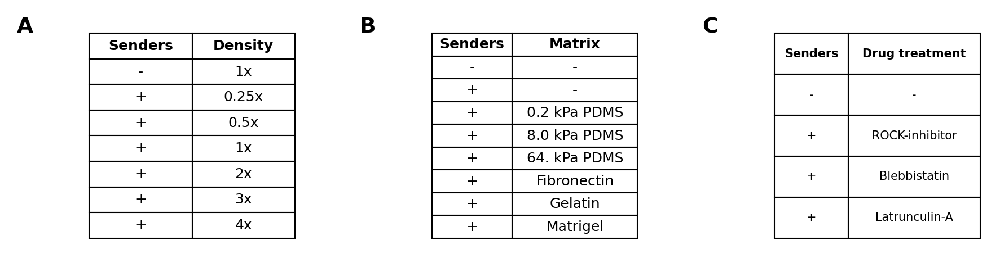

In [32]:
hv.output(hv.Layout(tables), dpi=dpi//2)

<hr>

In [5]:
# experiments = np.array([
#     "neg_control",
#     "pos_control",
#     "density",
#     "ECM",
#     "tension",
#     "tensionctrl",
#     "FGF2",
#     "FGF2ctrl",
# ])


In [6]:
# # Remove data pertaining to FGF2 treatment
# where_FGF2 = metadata.label.str.startswith("FGF2")

# sample_ids         = sample_ids[~where_FGF2]
# sample_experiments = sample_experiments[~where_FGF2]
# sample_labels      = sample_labels[~where_FGF2]
# sample_plotlabels  = sample_plotlabels[~where_FGF2]

# metadata = metadata.loc[~where_FGF2].reset_index(drop=True)

# experiments = experiments[:-2]

In [35]:
# Negative control data
neg_ctrl = data[0]

# Positive control data
pos_ctrl_samples = (metadata["experiment"]=="pos_control").values.nonzero()[0]
pos_ctrl = np.concatenate([data[i] for i in pos_ctrl_samples])

# Indices of experimental (non-control) samples
exp_sample_idx = (~pd.Series(sample_experiments).str.endswith("control").values).nonzero()[0]

# Extract experimental data
exp_data_list = [data[i].values for i in exp_sample_idx]

<hr>

In [36]:
# size = exp_conds.size
# exp_conds_sizes = np.array([ec_[1].size for ec_ in data_raw])
# metadata["N"] = exp_conds_sizes

<hr>

In [37]:
# heights = [350, 350, 350, 350, 350]
# widths  = [600, 350, 400, 400, 400]

In [38]:
# aspects    = [7/4, 3/4, 4/4, 4/4, 4/4]
# dpis       = [100,  50, 90, 100, 100]
# fontscales = [1.5, 3.0, 1.75, 1.5, 1.5]

In [39]:
# alpha, box_color, bw_method, ec, edgecolor, edgecolors, 
# facecolors, showextrema, showmeans, stats_color, widths

# exp_letters = sorted(Counter(experiments).keys())
# n_exp = len(exp_names)

In [128]:
# Control sample data and labels
# control_samples      = np.array([0, 3, 10])
control_data   = [neg_ctrl, pos_ctrl]
control_labels = np.array(["- senders", "+ senders"], dtype=str)

# Experimental samples in first row of violin plots
violin1_samples = np.array([1, 2, 4, 5, 6])
violin1_exp_data = [data[i] for i in violin1_samples]
violin1_exp_labels = metadata.plotlabel[violin1_samples].values.astype(str)

# Experimental samples in second row of violin plots
violin2_samples = np.array([7, 8, 9, 11, 12, 13, 14, 15, 16,])
violin2_exp_data = [data[i] for i in violin2_samples]
violin2_exp_labels = metadata.plotlabel[violin2_samples].values.astype(str)

In [129]:
violin1_labels = np.concatenate([control_labels, violin1_exp_labels])
violin1_data   = control_data + violin1_exp_data
violin1_sizes  = [arr.size for arr in violin1_data]

violin1_df = pd.DataFrame(dict(
    Condition    = np.repeat(violin1_labels, violin1_sizes),
    Fluorescence = np.concatenate(violin1_data),
))

viol1 = hv.Violin(
    violin1_df, 
    kdims="Condition", 
    vdims=["Fluorescence"], 
#     label=exp_titles[i],
).opts(
    ylim=(0,1000),
    xlabel="",
    xrotation=45,
    ylabel=r"mCherry (AU)",
#     fontscale=1.8,
#     axiswise=True,
    facecolors=cc.gray[175],
    box_color=(0,0,0,0),
    edgecolors=(0,0,0,0),
    stats_color="k",
#     showmeans=True,
#     inner=None,
    inner="medians",
    aspect=1.5,
#     height=heights[i],
#     width=widths[i],
#     box_fill_color=cc.gray[60],
#     box_alpha=0,
#     median_color="k",
#     violin_fill_color=cc.gray[200], 
)

:Violin   [Condition]   (Fluorescence)
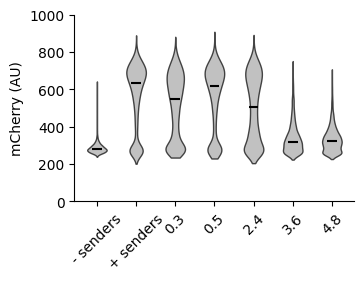

In [130]:
hv.output(viol1, dpi=100)

In [131]:
violin2_labels = np.concatenate([control_labels, violin2_exp_labels])
violin2_data   = control_data + violin2_exp_data
violin2_sizes  = [arr.size for arr in violin2_data]

violin2_df = pd.DataFrame(dict(
    Condition    = np.repeat(violin2_labels, violin2_sizes),
    Fluorescence = np.concatenate(violin2_data),
))

viol2 = hv.Violin(
    violin2_df, 
    kdims="Condition", 
    vdims=["Fluorescence"], 
#     label=exp_titles[i],
).opts(
    ylim=(0,1000),
    xlabel="",
    xrotation=45,
    ylabel=r"mCherry (AU)",
    fontscale=0.5,
#     axiswise=True,
    facecolors=cc.gray[175],
    box_color=(0,0,0,0),
    edgecolors=(0,0,0,0),
    stats_color="k",
#     showmeans=True,
#     inner=None,
    inner="medians",
    aspect=3,
#     height=heights[i],
#     width=widths[i],
#     box_fill_color=cc.gray[60],
#     box_alpha=0,
#     median_color="k",
#     violin_fill_color=cc.gray[200], 
)

:Violin   [Condition]   (Fluorescence)
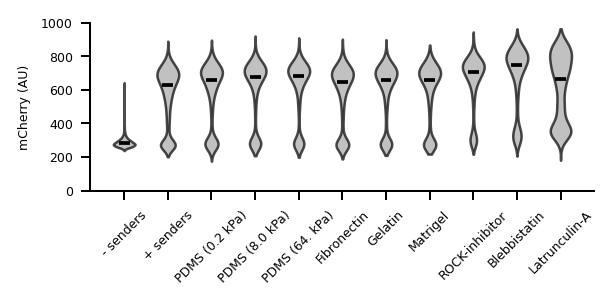

In [132]:
hv.output(viol2, dpi=180)

<hr>

# Old violin plot

In [29]:
#     # Reorder conditions for experiments G and H
#     if (i == 3) or (i == 4):
#         conds = conds[np.array([2, 1, 0])]
#         cond_data = [cond_data[i] for i in (2, 1, 0)]
    
    data = {
        "Condition"    : np.repeat(conds, exp_conds_sizes[mask]),
        "Fluorescence" : np.concatenate(cond_data),
    }
    
    v = hv.Violin(
        data, 
        kdims="Condition", 
        vdims=["Fluorescence"], 
        label=exp_titles[i],
    ).opts(
        ylim=(0,1000),
        xlabel=xlabels[i],
        ylabel=r"mCherry (AU)",
        fontscale=1.3,
        axiswise=True,
        height=heights[i],
        width=widths[i],
        box_fill_color=cc.gray[60],
        box_alpha=0,
        median_color="k",
        violin_fill_color=cc.gray[200], 
#         inner="medians",
#         aspect=1.5,
#         facecolors=cc.gray[200],
#         box_color=cc.gray[100],
#         edgecolors="r",
    )
    
    violins.append(v.opts(axiswise=True))
    
#     cutoff = hv.HLine(cutoff_val).opts(line_width=3, color="r", axiswise=True,)
#     violins.append((v * cutoff).opts(axiswise=True))

In [30]:
# hv.output(violins[3], dpi=80)

hv.output(hv.Layout(violins).cols(2), dpi=80)

:Layout
   .Violin.Cell_density            :Violin   [Condition]   (Fluorescence)
   .Violin.ECM_stiffness           :Violin   [Condition]   (Fluorescence)
   .Violin.ECM_composition         :Violin   [Condition]   (Fluorescence)
   .Violin.Cytoskeletal_tension.I  :Violin   [Condition]   (Fluorescence)
   .Violin.Cytoskeletal_tension.II :Violin   [Condition]   (Fluorescence)

## GMM 

In [16]:
from sklearn.mixture import GaussianMixture

In [17]:
# mask_for_cutoff = np.isin(exp_conds, ["A2", "A3", "A4", "A5"])
mask_for_cutoff = np.array(experiments == "A")
conds_cutoff = exp_conds[mask_for_cutoff]

In [18]:
data_for_cutoff = np.concatenate([
    data_raw[i][1] 
    for i in range(n_conds) 
    if mask_for_cutoff[i]
] ).reshape(-1, 1)

In [19]:
model = GaussianMixture(
    n_components=2, 
#     max_iter=400, 
#     n_init=8,
#     verbose=1,
#     tol=1e-10,
)

In [20]:
labels = model.fit_predict(data_for_cutoff)

In [21]:
on_fluor   = data_for_cutoff[labels == model.means_.argmax()]
off_fluor  = data_for_cutoff[labels == model.means_.argmin()]
cutoff_val = np.mean([off_fluor.max(), on_fluor.min()])

In [22]:
df_for_cutoff = {
    "fluor": np.sort(data_for_cutoff.ravel()),
    "percentile (ECDF)": np.arange(1, 1+data_for_cutoff.size)/data_for_cutoff.size,
    "label": labels[np.argsort(data_for_cutoff.ravel())],
}

In [23]:
ecdf = hv.Scatter(
    df_for_cutoff,
    kdims=["fluor"],
    vdims=["percentile (ECDF)", "label"]
).groupby(
    "label"
).opts(
    alpha=0.1,
).overlay(
).opts(
    show_legend=False,
)

hist = hv.Histogram(
    np.histogram(on_fluor.ravel(), np.linspace(0, 1000, 51))
).opts(
    alpha=0.5,
) * hv.Histogram(
    np.histogram(off_fluor.ravel(), np.linspace(0, 1000, 51))
).opts(
    alpha=0.5,
)

In [24]:
(ecdf + hist)

:Layout
   .NdOverlay.I :NdOverlay   [label]
      :Scatter   [fluor]   (percentile (ECDF),label)
   .Overlay.I   :Overlay
      .Histogram.I  :Histogram   [x]   (Frequency)
      .Histogram.II :Histogram   [x]   (Frequency)

In [25]:
print(f""" 
Fluorescence cutoff (in arbitrary units) should be set between

        {off_fluor.max()}    and    {on_fluor.min()} 

according to expectation-maximized GMM fit to data from experiment "A".
We will use the mean

        {(off_fluor.max() + on_fluor.min()) / 2:.1f} 

Using this cutoff, 
        
        {labels.sum() / labels.size * 100:.1f} %

of all data points were classified as "ON".
""")

 
Fluorescence cutoff (in arbitrary units) should be set between

        393    and    394 

according to expectation-maximized GMM fit to data from experiment "A".
We will use the mean

        393.5 

Using this cutoff, 
        
        56.2 %

of all data points were classified as "ON".



<hr>

## Frequency table 

In [31]:
fluor_is_on = [tup[1] > cutoff_val for tup in data_raw]

In [32]:
perc_on = np.array([arr.sum() / arr.size for arr in fluor_is_on])
metadata["%ON"] = perc_on

In [33]:
perc_on

array([0.00340136, 0.67493113, 0.74566038, 0.77267595, 0.6221936 ,
       0.20647125, 0.16946383, 0.75214592, 0.7633573 , 0.7804736 ,
       0.76144969, 0.76180849, 0.77494073, 0.75939306, 0.84433198,
       0.81169831, 0.76090669, 0.06129633, 0.10277228, 0.53934884])

In [34]:
print("\n".join([f"{(100 * i):.1f}" for i in metadata["%ON"]]))

0.3
67.5
74.6
77.3
62.2
20.6
16.9
75.2
76.3
78.0
76.1
76.2
77.5
75.9
84.4
81.2
76.1
6.1
10.3
53.9


In [35]:
metadata[["N", "Experiment", "Condition", "%ON", ]]

,N,Experiment,Condition,%ON
0,5586,Cell density,1X\n(NS),0.003401
1,5445,Cell density,0.3,0.674931
2,5300,Cell density,0.5,0.745660
3,5314,Cell density,1.2,0.772676
4,5434,Cell density,2.4,0.622194
5,6243,Cell density,3.6,0.206471
6,6733,Cell density,4.8,0.169464
7,4660,ECM stiffness,0.2,0.752146
8,5147,ECM stiffness,8.0,0.763357
9,5152,ECM stiffness,64.,0.780474


<hr>

In [36]:
%load_ext watermark

In [37]:
%watermark -p holoviews,jupyterlab,bokeh

holoviews : 1.14.3
jupyterlab: 1.2.6
bokeh     : 2.3.1



<hr>


# Code for wrangling + IO (deprecated)

<hr>

In [34]:
sample_ids = np.array(
    [
        "a1",
        "a2",
        "a3",
        "a4",
        "a5",
        "a6",
        "a7",
        "e1",
        "e2",
        "e3",
        "f1",
        "f2",
        "f3",
        "f4",
        "g1",
        "g2",
        "g3",
        "g4",
        "h1",
        "h2",
        "h3",
        "h4",
    ]
)
sample_fnames = [s + ".csv" for s in sample_ids]

sample_experiments = np.array(
    [
        "neg_control",
        "density",
        "density",
        "pos_control",
        "density",
        "density",
        "density",
        "ECM",
        "ECM",
        "ECM",
        "pos_control",
        "ECM",
        "ECM",
        "ECM",
        "cyto_tension",
        "FGF2",
        "cyto_tension",
        "cyto_tension",
        "cyto_tension_control",
        "FGF2_control",
        "cyto_tension_control",
        "cyto_tension_control",
    ]
)

sample_labels = np.array(
    [
        "control_neg_no_senders",
        "density_0.3",
        "density_0.5",
        "control_pos",
        "density_2.4",
        "density_3.6",
        "density_4.8",
        "ECM_PDMS_0.2",
        "ECM_PDMS_8.0",
        "ECM_PDMS_64.",
        "control_pos",
        "ECM_Fibronectin",
        "ECM_Gelatin",
        "ECM_Matrigel",
        "tension_ROCK-inhibitor",
        "FGF2",
        "tension_Blebbistatin",
        "tension_Latrunculin-A",
        "tensionctrl_ROCK-inhibitor",
        "FGF2ctrl",
        "tensionctrl_Blebbistatin",
        "tensionctrl_Latrunculin-A",
    ]
)

sample_plotlabels = np.array(
    [
        "- senders",
        "0.3",
        "0.5",
        "+ senders",
        "2.4",
        "3.6",
        "4.8",
        "PDMS (0.2 kPa)",
        "PDMS (8.0 kPa)",
        "PDMS (64. kPa)",
        "+ senders",
        "Fibronectin",
        "Gelatin",
        "Matrigel",
        "ROCK-inhibitor",
        "FGF2",
        "Blebbistatin",
        "Latrunculin-A",
        "ROCK-inhibitor (-S)",
        "FGF2 (NS)",
        "Blebbistatin (-S)",
        "Latrunculin-A (-S)",
    ]
)

In [35]:
df = pd.DataFrame(
    dict(
        filename = sample_fnames,
        id=sample_ids,
        experiment=sample_experiments,
        label=sample_labels,
        plotlabel=sample_plotlabels,
    )
)

In [36]:
df

,filename,id,experiment,label,plotlabel
0,a1.csv,a1,neg_control,control_neg_no_senders,- senders
1,a2.csv,a2,density,density_0.3,0.3
2,a3.csv,a3,density,density_0.5,0.5
3,a4.csv,a4,pos_control,control_pos,+ senders
4,a5.csv,a5,density,density_2.4,2.4
5,a6.csv,a6,density,density_3.6,3.6
6,a7.csv,a7,density,density_4.8,4.8
7,e1.csv,e1,ECM,ECM_PDMS_0.2,PDMS (0.2 kPa)
8,e2.csv,e2,ECM,ECM_PDMS_8.0,PDMS (8.0 kPa)
9,e3.csv,e3,ECM,ECM_PDMS_64.,PDMS (64. kPa)


In [42]:
# df.to_csv("C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\FACS_data.csv", index = False)

<hr>

In [48]:
data_dir = os.path.join(os.getcwd(), "FACS_data_old_names")
files_raw = pd.Series(glob(os.path.join(data_dir, "*.csv")))
files_raw.name = "filename"

In [49]:
filenames = []
data = []

for i, id_ in enumerate(sample_ids):
    f = files_raw[files_raw.str.contains(id_)].values[0]
    d = pd.read_csv(f).squeeze()
    
    filenames.append(f)
    data.append(d)

filenames = np.array(filenames)

In [10]:
filenames

array(['C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a1_001_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a2_002_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a3_003_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a4_004_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a5_005_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a6_006_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_a7_007_Q3 BV421-A+ , APC-A-.csv',
       'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\FACS_data\\export_Specimen_001_e1_022_Q3 BV421-A+ , APC-A

In [33]:
import os
import shutil

In [58]:
for f_src, f_dst_ in zip(filenames, sample_fnames):
    
    f_dst = os.path.realpath(os.path.join("FACS_data/", f_dst_))
    
    # print(f_src)
    # print(f_dst)
    
    shutil.copy(f_src, f_dst)

<hr>

In [492]:
# Set filenames for I/O
metadata_fname = os.path.join(data_dir, "metadata.csv")

In [492]:
# Read in metadata
metadata = pd.read_csv(metadata_fname)

# Read in data
data = [pd.read_csv(os.path.join(data_dir, f)).squeeze() for f in metadata.filename]

# Get # samples
n_samples = metadata.shape[0]

In [493]:
metadata["Experiment"] = ["Neg. Ctrl."] + ["Density"] * 6 + ["ECM"] * 7 + ["Tension"] + ["FGF2"] + ["Tension"] * 3 + ["FGF2"] + ["Tension"] * 2 + ["Pos. Ctrls."]

metadata["Control"] = np.array(["-", "Neg", "Pos"])[metadata.experiment.str.contains("control").astype(int) + metadata.experiment.str.contains("pos_control").astype(int)]
# metadata.loc[metadata.experiment=="neg_control", "Control"] = "Neg"

metadata["Senders"] = ["-" if ("- " in l) or ("-S" in l) else "+" for l in metadata.plotlabel]

metadata["Density"] = ["1x", "0.25x", "0.5x", "1x", "2x", "3x", "4x"] + ["1x"] * 16

metadata["Matrix"] = [l if ("ECM" in e) else "-" for e, l in zip(metadata.experiment, metadata.plotlabel)]

metadata["Drug treatment"] = [l.split()[0] if ("cyto_tension" in e) or ("FGF2" in e) else "-" for e, l in zip(metadata.experiment, metadata.plotlabel)]

In [494]:
del metadata["id"]
del metadata["experiment"]
del metadata["label"]
del metadata["plotlabel"]

In [495]:
metadata = metadata.sort_values(["Experiment", "filename"]).reset_index(drop=True)
metadata = metadata.reset_index()
metadata.loc[15, "index"] = -1
metadata.loc[16, "index"] = 1000
metadata.loc[[6, 7, 8, 9], "index"] = (7, 8, 9, 6)
metadata = metadata.sort_values("index").reset_index(drop=True)
del metadata["index"]

In [496]:
metadata["Label"] = ""
metadata.loc[ 3, "Label"] = "▲"
metadata.loc[11, "Label"] = "●"
metadata.loc[22, "Label"] = "▲ & ●"

In [497]:
metadata["subplot"] = [
    "abcd",
    "ad",
    "ad",
    "ad",
    "ad",
    "ad",
    "ad",
    "bd",
    "bd",
    "bd",
    "bd",
    "bd",
    "bd",
    "bd",
    "x",
    "x",
    "cd",
    "cd",
    "cd",
    "x",
    "x",
    "x",
    "d",
]

In [498]:
metadata.to_csv(os.path.join(data_dir, "metadata2.csv"), index=False)